In [64]:
import numpy as np
import matplotlib.pylab as plt
import pandas as pd
import matplotlib as mpl
import scipy.stats as st
from scipy.stats import (vonmises_line, norm, t, cauchy, lognorm, fisk, skewnorm, exponweib, genlogistic, logistic, laplace)
import hdbscan
import seaborn as sns
import colorcet as cc

from scipy import stats

import random

import glob
import os
from tqdm import tqdm

### Define colors an colormaps

In [2]:
# Color definitions
ClrS = (0.74, 0.00, 0.00)
ClrN = (0.20, 0.56, 1.00)

Clr = [(0.00, 0.00, 0.00),
      (0.31, 0.24, 0.00),
      (0.43, 0.16, 0.49),
      (0.32, 0.70, 0.30),
      (0.45, 0.70, 0.90),
      (1.00, 0.82, 0.67)]

### Read data, add date, Calibrate flux for MDI using 0.8 factor, and apply 3x10^21 Mx cuttoff

In [3]:
# Flux Cutoff in Maxwells
fCutoff = 3e21

KPVT = pd.read_csv('data/output/BARD_1976-1993_KPVT_tilts.csv')
KPVT = KPVT.loc[KPVT['BMRFlux']>=fCutoff,:]
KPVT['Date'] = pd.to_datetime(dict(year=KPVT.Year, month=KPVT.Month, day=KPVT.Day, hour=KPVT.Hour, minute=KPVT.Minute))
KPVT['Instrument'] = 'KPVT'

SPMG = pd.read_csv('data/output/BARD_1992-1999_SPMG_tilts.csv')
SPMG = SPMG.loc[SPMG['BMRFlux']>=fCutoff,:]
SPMG['Date'] = pd.to_datetime(dict(year=SPMG.Year, month=SPMG.Month, day=SPMG.Day, hour=SPMG.Hour, minute=SPMG.Minute))
SPMG['Instrument'] = 'SPMG'
SPMG['BMRLabel'] = SPMG['BMRLabel'] + np.max(KPVT['BMRLabel'])

MDIcalibration = 0.8
MDI = pd.read_csv('data/output/BARD_1996-2010_MDI_tilts.csv')
MDI.loc[:, ['PFlux', 'NFlux', 'BMRFlux']] *= MDIcalibration
MDI = MDI.loc[MDI['BMRFlux']>=fCutoff,:]
MDI['Date'] = pd.to_datetime(dict(year=MDI.Year, month=MDI.Month, day=MDI.Day, hour=MDI.Hour, minute=MDI.Minute))
MDI['Instrument'] = 'MDI'
MDI['BMRLabel'] = MDI['BMRLabel'] + np.max(SPMG['BMRLabel'])

HMI = pd.read_csv('data/output/BARD_2010-2016_HMI_tilts.csv')
HMI = HMI.loc[HMI['BMRFlux']>=fCutoff,:]
HMI['Date'] = pd.to_datetime(dict(year=HMI.Year, month=HMI.Month, day=HMI.Day, hour=HMI.Hour, minute=HMI.Minute))
HMI['Instrument'] = 'HMI'
HMI['BMRLabel'] = HMI['BMRLabel'] + np.max(MDI['BMRLabel'])


In [4]:
HMI

,ReferenceDay,Year,Month,Day,Hour,Minute,Second,BMRLabel,PFlux,PArea,...,HH_24n,AH_24n,HH_24s,AH_24s,Cycle24n,Cycle24s,Hale,AntiHale,Date,Instrument
1,486,2010,5,2,21,46,22.4,13425,5.720000e+21,2.400000e+19,...,True,False,False,False,True,False,True,False,2010-05-02 21:46:00,HMI
4,488,2010,5,4,21,46,22.6,13428,3.050000e+21,1.570000e+19,...,False,False,True,False,False,True,True,False,2010-05-04 21:46:00,HMI
5,490,2010,5,6,21,46,22.9,13429,4.240000e+21,1.410000e+19,...,True,False,False,False,True,False,True,False,2010-05-06 21:46:00,HMI
6,507,2010,5,23,21,46,24.7,13430,3.420000e+21,7.870000e+18,...,False,False,True,False,False,True,True,False,2010-05-23 21:46:00,HMI
7,512,2010,5,28,21,46,25.1,13431,2.150000e+21,8.790000e+18,...,True,False,False,False,True,False,True,False,2010-05-28 21:46:00,HMI
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1448,2719,2016,6,12,21,46,46.7,16059,4.150000e+21,2.040000e+19,...,True,False,False,False,True,False,True,False,2016-06-12 21:46:00,HMI
1451,2724,2016,6,17,21,46,46.9,16063,3.950000e+21,1.390000e+19,...,False,False,True,False,False,True,True,False,2016-06-17 21:46:00,HMI
1453,2725,2016,6,18,21,46,47.0,16066,2.080000e+21,1.060000e+19,...,True,False,False,False,True,False,True,False,2016-06-18 21:46:00,HMI
1454,2727,2016,6,20,21,46,47.0,16068,1.150000e+22,2.030000e+19,...,False,False,True,False,False,True,True,False,2016-06-20 21:46:00,HMI


### Remove overlaps between missions

In [5]:
KPVT = KPVT.loc[KPVT['Date']<np.min(SPMG['Date']),:]
SPMG = SPMG.loc[SPMG['Date']<np.min(MDI['Date']),:]
MDI = MDI.loc[MDI['Date']<np.min(HMI['Date']),:]

### Concatenate all instruments

In [6]:
allMag = pd.concat([KPVT, SPMG, MDI, HMI], ignore_index=True).drop(labels=['ReferenceDay', 'Flux_cut'], axis=1).replace(np.nan, False).sort_values(by = ['Date']).reset_index(drop = True)
allMag.to_csv('data/output/BARD_1976-2016_Merge_tilts.csv', index=False)

allMag['pltSize'] = (np.sqrt(allMag['BMRFlux']/1e21))
allMag

,Year,Month,Day,Hour,Minute,Second,BMRLabel,PFlux,PArea,PLatitude,...,AH_23s,Cycle23n,Cycle23s,HH_24n,AH_24n,HH_24s,AH_24s,Cycle24n,Cycle24s,pltSize
0,1976,1,13,17,26,59.0,1,6.690000e+21,1.590000e+19,-9.9094,...,False,False,False,False,False,False,False,False,False,4.614109
1,1976,2,15,18,19,8.0,3,2.370000e+21,1.170000e+19,-11.1080,...,False,False,False,False,False,False,False,False,False,1.939072
2,1976,2,20,18,43,18.0,4,2.490000e+21,1.440000e+19,-2.6919,...,False,False,False,False,False,False,False,False,False,2.209072
3,1976,3,13,21,24,36.0,8,3.080000e+21,1.270000e+19,-33.7100,...,False,False,False,False,False,False,False,False,False,2.424871
4,1976,8,12,21,14,0.0,13,1.790000e+21,9.400000e+18,23.7860,...,False,False,False,False,False,False,False,False,False,1.769181
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7565,2016,6,13,21,46,46.7,16058,3.250000e+21,7.780000e+18,8.1019,...,False,False,False,True,False,False,False,True,False,2.983287
7566,2016,6,17,21,46,46.9,16063,3.950000e+21,1.390000e+19,-8.5136,...,False,False,False,False,False,True,False,False,True,2.505993
7567,2016,6,18,21,46,47.0,16066,2.080000e+21,1.060000e+19,6.2451,...,False,False,False,True,False,False,False,True,False,2.017424
7568,2016,6,20,21,46,47.0,16068,1.150000e+22,2.030000e+19,-6.1588,...,False,False,False,False,False,True,False,False,True,3.506565


In [7]:
for k in allMag.BMRLabel:
    df_k = pd.DataFrame((allMag.BMRLabel==k))*1
    
allMag[allMag.BMRLabel==247].index[1]
#allMag.drop(135,axis=0)

138

In [8]:
for k in allMag.BMRLabel:
    df_k = (allMag.BMRLabel==k)*1
    suma = df_k.sum()#[0]
    if suma > 1:
        index_1 = allMag[allMag.BMRLabel==k].index[1]
        allMag = allMag.drop(index_1, axis=0)

In [9]:
df = pd.DataFrame(allMag.BMRLabel)
counter = 0
for k in allMag.BMRLabel:
    df_k = (allMag.BMRLabel==k)*1
    suma = df_k.sum()#[0]
    if suma > 1:
        counter +=1
        print('Problema en BMRLabel ', k)

In [10]:
allMag = allMag.reset_index()

### Plot data

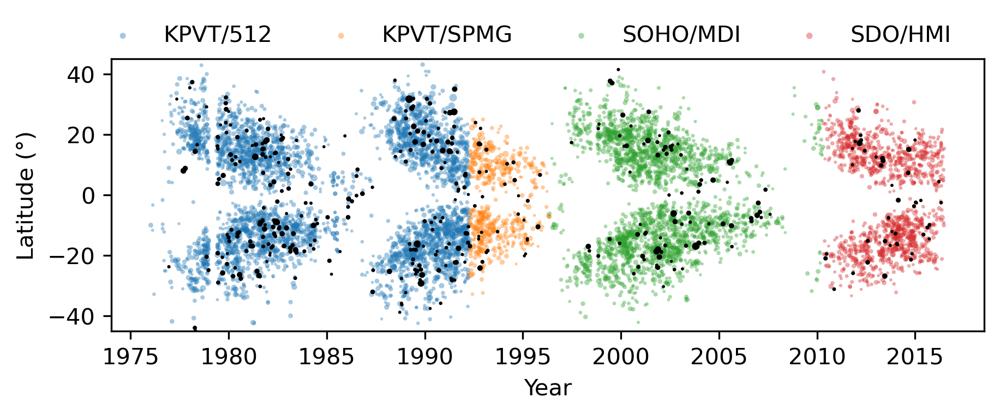

In [11]:
# Size definitions
dpi = 300
pxx = 1600  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)

ax1 = fig.add_axes([ppadh, ppadv, ppxx, ppxy])

size = (np.sqrt(KPVT['BMRFlux']/1e21))
ax1.scatter(KPVT['Date'], KPVT['BMRLatitude'], s=size, alpha=0.4, ec='None', label='KPVT/512')


size = (np.sqrt(SPMG['BMRFlux']/1e21))
ax1.scatter(SPMG['Date'], SPMG['BMRLatitude'], s=size, alpha=0.4, ec='None', label='KPVT/SPMG')


size = (np.sqrt(MDI['BMRFlux']/1e21))
ax1.scatter(MDI['Date'], MDI['BMRLatitude'], s=size, alpha=0.4, ec='None', label='SOHO/MDI')


size = (np.sqrt(HMI['BMRFlux']/1e21))
ax1.scatter(HMI['Date'], HMI['BMRLatitude'], s=size, alpha=0.4, ec='None', label='SDO/HMI')


size = (np.sqrt(allMag['BMRFlux']/1e21))
mask = allMag['AntiHale']
ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=1,fc='k', ec='None')


ax1.set_ylim([-45, 45])
ax1.set_ylabel('Latitude (°)')
ax1.set_xlabel('Year')
ax1.legend(frameon=False, ncol=4, loc='upper center', bbox_to_anchor=(0.475, 1.2))



# Tilt Distributions for different cycles

/tmp/ipykernel_948/1269498155.py:43: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=0.4, ec='None', label=f'Cycle{str(cyc)}', c=Clr[cyc-19])


/tmp/ipykernel_948/1269498155.py:43: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=0.4, ec='None', label=f'Cycle{str(cyc)}', c=Clr[cyc-19])
/tmp/ipykernel_948/1269498155.py:43: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=0.4, ec='None', label=f'Cyc

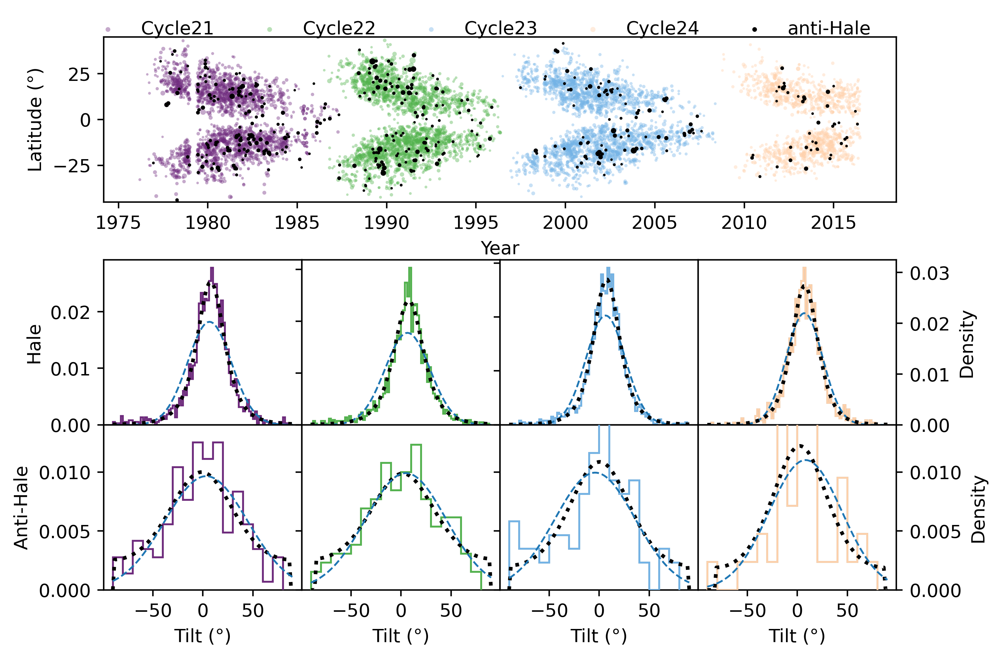

In [12]:
tbins = np.arange(-90, 90, 2)
x = np.linspace(-90, 90, 100)

# Size definitions
dpi = 400
pxx = 600  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)

ax1 = fig.add_axes([ppadh, ppadv, 4*ppxx, ppxy])

size = (np.sqrt(allMag['BMRFlux']/1e21))
for cyc in np.arange(21,25):

    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])
    ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=0.4, ec='None', label=f'Cycle{str(cyc)}', c=Clr[cyc-19])

    tbins = np.arange(-90, 90, 2)
    ax2 = fig.add_axes([ppadh + (cyc-21)*ppxx, ppadv-ppxy*1.35, ppxx, ppxy])
    mask = np.logical_and(mask, allMag[f'Hale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc-19], zorder=3)

    ax2.plot(x, st.norm.pdf(x, *norm.fit(tilt)), color='C0', ls='--', lw=1, label='normal', zorder=3)
    ax2.plot(x, st.t.pdf(x, *t.fit(tilt)), color='k', ls=':', lw=2, label='Student\'s-t', zorder=3)    


    for cyc2 in np.arange(21,25):

        if cyc2 != cyc:

            mask2 = np.logical_or(allMag[f'Cycle{str(cyc2)}n'],allMag[f'Cycle{str(cyc2)}s'])
            mask2 = np.logical_and(mask, allMag[f'Hale'])
            tilt = np.concatenate((-allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']<0),'Tilt_rel']))
            ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc2-19], alpha=0.4, zorder=1)


    ax2.set_xlabel('Tilt (°)')

    if cyc>21 and cyc<24:
        ax2.set_yticklabels([])

    if cyc==24:
        ax2.yaxis.set_label_position('right')
        ax2.yaxis.tick_right()
        ax2.set_ylabel('Density')

    if cyc==21:
        ax2.set_ylabel('Hale')



    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])

    tbins = np.arange(-90, 90, 10)
    ax2 = fig.add_axes([ppadh + (cyc-21)*ppxx, ppadv-ppxy*2.35, ppxx, ppxy])
    mask = np.logical_and(mask, allMag[f'AntiHale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc-19], zorder=3)




    ax2.plot(x, st.vonmises_line.pdf(x*np.pi/180, *vonmises_line.fit(tilt*np.pi/180))*np.pi/180, color='k', ls=':', lw=2, label='normal', zorder=3)
    ax2.plot(x, st.norm.pdf(x, *norm.fit(tilt)), color='C0', ls='--', lw=1, label='normal', zorder=3)

    for cyc2 in np.arange(21,25):

        if cyc2 != cyc:

            mask2 = np.logical_or(allMag[f'Cycle{str(cyc2)}n'],allMag[f'Cycle{str(cyc2)}s'])
            mask2 = np.logical_and(mask, allMag[f'AntiHale'])
            tilt = np.concatenate((-allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask2, allMag['BMRLatitude']<0),'Tilt_rel']))
            ax2.hist(tilt, bins = tbins, density=True, histtype='step', lw=1, label='Hale', color=Clr[cyc2-19], alpha=0.4, zorder=1)


    ax2.set_xlabel('Tilt (°)')
    ax2.set_ylim([0, 0.014])

    if cyc>21 and cyc<24:
        ax2.set_yticklabels([])

    if cyc==24:
        ax2.yaxis.set_label_position('right')
        ax2.yaxis.tick_right()
        ax2.set_ylabel('Density')

    if cyc==21:
        ax2.set_ylabel('Anti-Hale')        
    


mask = allMag['AntiHale']
ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLatitude'], s=size[mask], alpha=1,fc='k', ec='None', label='anti-Hale')


ax1.set_ylim([-45, 45])
ax1.set_ylabel('Latitude (°)')
ax1.set_xlabel('Year')
ax1.legend(frameon=False, ncol=5, loc='upper center', bbox_to_anchor=(0.475, 1.2))

### Akaike Information Criterion on different cycles

In [13]:
# AKAIKE
def aic(data, dist, distname):
    if distname=='vonmises_l':
        log_likelihood = dist.logpdf(data, *dist.fit(data))
    else:
        log_likelihood = dist.logpdf(data, *dist.fit(data))
    aic_score =  2 * len(dist.fit(data)) - 2 * np.sum(log_likelihood)
    return aic_score

def aic_analysis(data):
#     dist = np.array([norm, cauchy, t, lognorm, fisk, skewnorm, exponweib])
#     dist1 = ['norm', 'cauchy', 't-student', 'lognorm', 'loglogistic', 'skewnorm', 'exponweib']
    dist = np.array([t, laplace, logistic, vonmises_line, skewnorm, norm, cauchy])
    dist1 = ['t-student', 'laplace', 'logistic', 'vonmises_l', 'skewnorm', 'norm','cauchy']

    akaike = np.zeros(len(dist))
    for k in range(len(dist)):
        akaike[k] = aic(data, dist[k], dist1[k])
        
    
    KS = np.zeros(len(dist))
    p = np.zeros(len(dist))
    for k in range(len(dist)):
        if dist1[k]=='vonmises_l':
            print(dist1[k], dist[k].fit(data))
        else:
            print(dist1[k], dist[k].fit(data))
        KS[k], p[k] = st.ks_1samp(data, dist[k](*dist[k].fit(data)).cdf)

    RL = np.exp((min(akaike) - akaike)/2)
    AICw = np.round(RL/np.sum(RL),2)
    df = pd.DataFrame({'dist': dist1, 'ΔAIC': np.round(akaike - min(akaike),2), 'RelativeLikelihood': np.round(RL,2), 'AICw': AICw, 'KS': np.round(KS,3), 'p': np.round(p,2)})
    return df

def lat_aic(data, lat_data, maxim=4, interval=10):
    # Asumption that data already has been corrected to combine
    
    df = pd.DataFrame(aic_analysis(data)['dist'])
    for i in np.arange(0, maxim, 1):
        name = 'RL ' + str(i*interval) + '-' + str((i+1)*interval)
        df[name] = aic_analysis(data[np.logical_and(lat_data > i*interval,
                                                    lat_data < (i+1)*interval)])['AICw']
        
    return df

### Hale

In [14]:
for cyc in np.arange(21,25):
    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])
    mask = np.logical_and(mask, allMag[f'Hale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    print(f'Cycle {cyc} ------------------------------')
    df = aic_analysis(tilt)
    print(df)

Cycle 21 ------------------------------


t-student (3.2077381697748133, 7.851735836777384, 14.606395911082725)
laplace (7.96499615262943, 15.501142216106597)
logistic (7.484815321428147, 11.296832915521868)
vonmises_l (2.874638955372045, 7.216495559054838, 30.840403557480094)
skewnorm (-1.5168009540009297, 25.693433505237692, 29.053215599289626)
norm (6.606866807844698, 21.904145690498304)
cauchy (8.1109124004522, 10.298948981933492)
         dist    ΔAIC  RelativeLikelihood  AICw     KS     p
0   t-student    0.00                1.00  0.99  0.016  0.68
1     laplace    9.51                0.01  0.01  0.025  0.19
2    logistic   63.70                0.00  0.00  0.035  0.02
3  vonmises_l   74.54                0.00  0.00  0.050  0.00
4    skewnorm  208.51                0.00  0.00  0.072  0.00
5        norm  282.56                0.00  0.00  0.084  0.00
6      cauchy  319.22                0.00  0.00  0.057  0.00
Cycle 22 ------------------------------
t-student (3.3697491907334847, 7.683094852279156, 15.460580268860689)
lapla

### Anti-Hale

In [15]:
for cyc in np.arange(21,25):
    mask = np.logical_or(allMag[f'Cycle{str(cyc)}n'],allMag[f'Cycle{str(cyc)}s'])
    mask = np.logical_and(mask, allMag[f'AntiHale'])
    tilt = np.concatenate((-allMag.loc[np.logical_and(mask, allMag['BMRLatitude']>0),'Tilt_rel'], allMag.loc[np.logical_and(mask, allMag['BMRLatitude']<0),'Tilt_rel']))
    print(f'Cycle {cyc} ------------------------------')
    df = aic_analysis(tilt)
    print(df)

Cycle 21 ------------------------------
t-student (418290311.2862911, 3.294394601429426, 41.33972381266514)
laplace (2.250248789610824, 32.85200236198563)
logistic (2.924476303917301, 23.718537457479016)
vonmises_l (0.6779591048350753, -1.3404805227515624, 28.043970205674512)
skewnorm (0.5802731545492097, -14.7757867596562, 45.11692716114318)
norm (3.29439613384211, 41.340121373546324)
cauchy (1.967773623661208, 24.415518694588044)
         dist   ΔAIC  RelativeLikelihood  AICw     KS     p
0   t-student  23.07                 0.0   0.0  0.052  0.78
1     laplace  34.74                 0.0   0.0  0.061  0.59
2    logistic  25.36                 0.0   0.0  0.038  0.97
3  vonmises_l   0.00                 1.0   1.0  0.063  0.55
4    skewnorm  23.04                 0.0   0.0  0.050  0.82
5        norm  21.07                 0.0   0.0  0.052  0.78
6      cauchy  75.15                 0.0   0.0  0.089  0.16
Cycle 22 ------------------------------
t-student (1083935530.423653, 4.753346438216

# Tilt averages and standard deviations

# BMRs

In [16]:
# allMag

BMR_R = (allMag['PpixelAvgRadius'] + allMag['NpixelAvgRadius'])/2

DBMr = 3/(4*np.pi)*allMag['BMRFlux']/(allMag['BMRArea']*1e4)*BMR_R*np.pi/180

DBMr_HH = DBMr[allMag.Hale]*2*np.cos(allMag[allMag.Hale].BMRLatitude*np.pi/180)*( np.sin(allMag[allMag.Hale].PLatitude*np.pi/180) - np.sin(allMag[allMag.Hale].NLatitude*np.pi/180) )

DBMr_AH = -DBMr[allMag.AntiHale]*2*np.cos(allMag[allMag.AntiHale].BMRLatitude*np.pi/180)*( np.sin(allMag[allMag.AntiHale].NLatitude*np.pi/180) - np.sin(allMag[allMag.AntiHale].PLatitude*np.pi/180) )

In [17]:
allMag['BMRColatitude'] = (90 - allMag.BMRLatitude) * np.pi/180
allMag['PColatitude'] = (90 - allMag.PLatitude) * np.pi/180
allMag['NColatitude'] = (90 - allMag.NLatitude) * np.pi/180

R_sun = 6.96 * 10e8 * 10e2  # cm

D_bmr = - (3/(4*np.pi)) * allMag.BMRFlux * np.sin(allMag.BMRColatitude) * (allMag.PColatitude - allMag.NColatitude) / R_sun**2

D_bmr_HH = D_bmr[allMag.Hale]
D_bmr_AH = D_bmr[allMag.AntiHale]

### Remove spotless days

In [18]:
allMag = allMag.loc[np.isfinite(allMag["BMRLatitude"]), :]

In [19]:
DBMrs = pd.concat([DBMr_HH, DBMr_AH])
DBMrs = pd.DataFrame(DBMrs)
allMag['DBMr'] = D_bmr

# Active longitudes

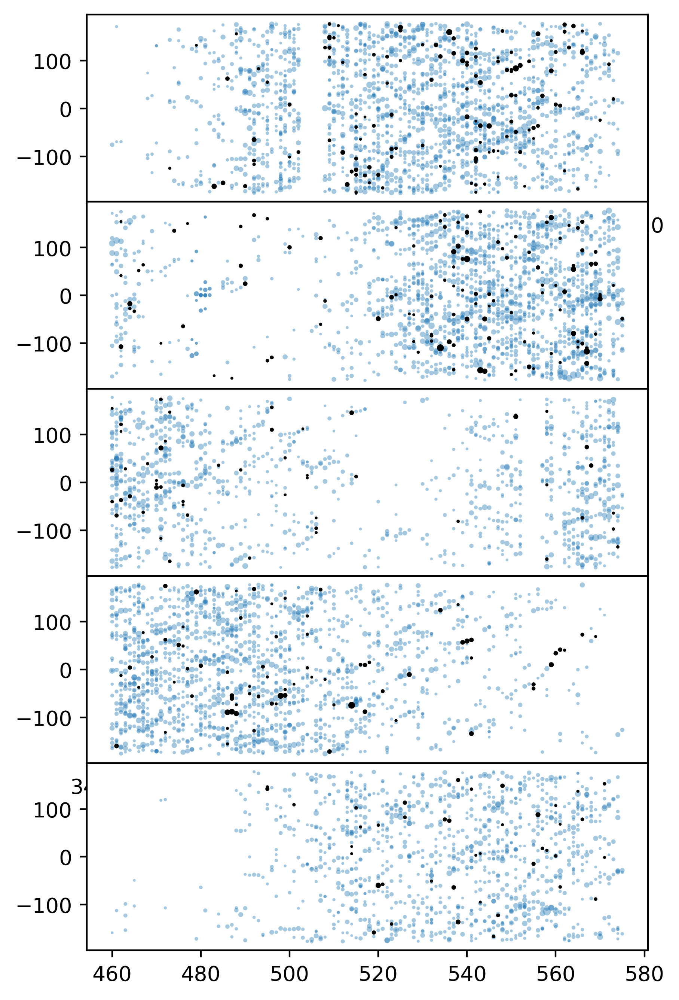

In [20]:
duration = pd.Timedelta(8*365, "d") # In years
t1 = np.min(allMag['Date'])
t2 = np.max(allMag['Date'])

rotation_rate = 25.38 # in days

allMag['Rot_time'] = np.floor((allMag['Date']-np.min(allMag['Date'])).dt.days//rotation_rate)

# allMag['BMRLongitude'] -= 360*allMag['BMRLongitude']//360

ncycles = np.round((t2-t1)/duration)


# Size definitions
dpi = 400
pxx = 1500  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)



size = (np.sqrt(allMag['BMRFlux']/1e21))
for n in np.arange(0,ncycles):
    
    ax1 = fig.add_axes([ppadh, ppadv-n*ppxy, ppxx, ppxy])

    # mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
    # ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')

    # mask = np.logical_and(mask, allMag['AntiHale'])
    # ax1.scatter(allMag.loc[mask,'Date'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,fc='k', ec='None')


    mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
    ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')

    mask = np.logical_and(mask, allMag['AntiHale'])
    ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,fc='k', ec='None')    

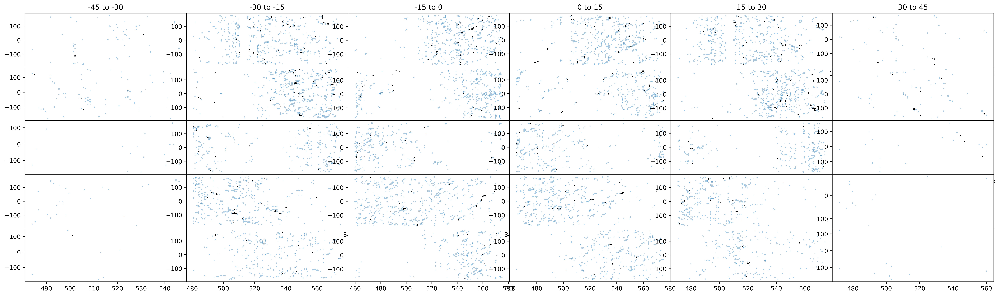

In [21]:
duration = pd.Timedelta(8*365, "d") # In years
t1 = np.min(allMag['Date'])
t2 = np.max(allMag['Date'])

rotation_rate = 25.38 # in days

allMag['Rot_time'] = np.floor((allMag['Date']-np.min(allMag['Date'])).dt.days//rotation_rate)

# allMag['BMRLongitude'] -= 360*allMag['BMRLongitude']//360

ncycles = np.round((t2-t1)/duration)


# Size definitions
dpi = 400
pxx = 1500  # Horizontal size of each panel
pxy = 500  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)



size = (np.sqrt(allMag['BMRFlux']/1e21))

for i in np.arange(0,6):

    l1 = -45+i*15
    l2 = -45+(i+1)*15

    for n in np.arange(0,ncycles):
        
        ax1 = fig.add_axes([ppadh+i*ppxx, ppadv-n*ppxy, ppxx, ppxy])

        mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
        mask = np.logical_and(mask, allMag['BMRLatitude']>=l1)
        mask = np.logical_and(mask, allMag['BMRLatitude']<l2)
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=0.4, ec='None')

        mask = np.logical_and(mask, allMag['AntiHale'])
        ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,fc='k', ec='None')

        if n==0:
            ax1.set_title(f'{l1} to {l2}')

     

In [22]:
# reference day
# time_0 = '1970-01-01 00:00:00'

time_0 = pd.to_datetime(0)
ref_day = (allMag['Date'] - time_0)

for i in range(len(ref_day)):
    ref_day[i] = ref_day[i].days

allMag['ReferenceDay'] = ref_day
ref_day

/tmp/ipykernel_948/3177668154.py:8: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '2203' has dtype incompatible with timedelta64[ns], please explicitly cast to a compatible dtype first.
  ref_day[i] = ref_day[i].days


0        2203
1        2236
2        2241
3        2263
4        2415
        ...  
7538    16965
7539    16969
7540    16970
7541    16972
7542    16981
Name: Date, Length: 7543, dtype: object

In [23]:
ref_day

0        2203
1        2236
2        2241
3        2263
4        2415
        ...  
7538    16965
7539    16969
7540    16970
7541    16972
7542    16981
Name: Date, Length: 7543, dtype: object

In [24]:
import astropy.units as u

In [25]:
# diferential rotation

def dif_rotation(lat):
    A = 14.113463 *u.deg / u.d             # degrees/days
    B = -1.6979719 *u.deg / u.d            # degrees/days
    C = -1.787 *u.deg / u.d            # degrees/days
    c_r = 14.182768 *u.deg / u.d      # degrees/days

    return(A + B * np.sin(lat)**2 + C * np.sin(lat)**4)

## Tarea Oct/12/23

- Para una region, calcular la distancia a todas las demas usando la latitud y la longitud corregida OK
- Hacer la matriz de distancias OK
- revisar que sea simétrica OK
- se puede visualizar usando ax.pcolormesh

### brownie points
- probar el hdbscan con esa matriz

Ejemplo de visualización https://hdbscan.readthedocs.io/en/latest/parameter_selection.html

Usar UMAP:  https://umap-learn.readthedocs.io/en/latest/
si no, t-SNE


In [26]:
import astropy.units as u
import seaborn as sns
import hdbscan

In [27]:
# distancia para una región
# https://www.movable-type.co.uk/scripts/latlong.html

def reg_distance(all_mag, region):
    
    lon = region['BMRLongitude']*u.deg
    lat = region['BMRLatitude']*u.deg
    ref_day = region['Date']

    rotation = dif_rotation(lat)
    
    bmr_latitude = all_mag['BMRLatitude'].values *u.deg
    bmr_longitude = all_mag['BMRLongitude'].values *u.deg

    # print("Latitude", lat, bmr_latitude)
    # print("Longitude", lon, bmr_longitude)

    rotation_diff = np.abs(dif_rotation(bmr_latitude) - rotation)
    # print("Ref. Rotation", rotation, "Region Rotation", dif_rotation(bmr_latitude), "Rotation Diff.", rotation_diff)

    # print("Time diff", (all_mag['Date'] - ref_day))
    # print("Time diff", ((all_mag['Date'] - ref_day).dt.total_seconds().values*u.s).to(u.d))

    time_diff = (((ref_day - all_mag['Date']).dt.total_seconds().values*u.s).to(u.d)).value
    corrected_longitude = bmr_longitude - rotation_diff * time_diff * u.d


    # print("Ref. Longitude", lon, "Region Longitudes", bmr_longitude, "Corrected longitude", corrected_longitude)
    # corrected_longitude = corrected_longitude + 360*np.mod(corrected_longitude,360*u.deg)
    # print("Corrected longitude", lon, corrected_longitude)    

    # corrected_longitude[corrected_longitude > 180*u.deg] = corrected_longitude[corrected_longitude > 180*u.deg] - 360*u.deg
    # corrected_longitude[corrected_longitude < -180*u.deg] = corrected_longitude[corrected_longitude < -180*u.deg] + 360*u.deg

    # print("Corrected longitude", lon, corrected_longitude)


    # distance

    R_sun = 695700 *u.km  # sun radius (km)
    # delta_lambda = np.mod(np.abs(corrected_longitude - lon), 360 *u.deg)
    delta_lambda = corrected_longitude - lon
    # delta_lambda[delta_lambda > 180*u.deg] = 360*u.deg - delta_lambda[delta_lambda > 180*u.deg]

    delta_lat = (bmr_latitude - lat)
    # delta_sigma = np.arccos(np.sin(lat) * np.sin(bmr_latitude) + np.cos(lat) * np.cos(bmr_latitude) * np.cos(delta_lambda))
    harversin = np.power(np.sin(delta_lat/2), 2) + np.cos(lat)*np.cos(bmr_latitude)*np.power(np.sin(delta_lambda/2), 2)
    delta_sigma = 2*np.arctan2(np.sqrt(harversin), np.sqrt(1-harversin))

    distance = delta_sigma.to(u.deg) # *R_sun

    return(distance, np.abs(time_diff))    

#### Symmetry test

In [28]:
## Pick two random regions
inx1 = np.random.randint(0, allMag.shape[0])
inx2 = np.random.randint(0, allMag.shape[0])

print(allMag.iloc[[inx1], 0:].loc[:,['BMRLatitude', 'BMRLongitude', 'Date']])
print(allMag.iloc[[inx2], 0:].loc[:,['BMRLatitude', 'BMRLongitude', 'Date']])

print(reg_distance(allMag.iloc[[inx2], 0:], allMag.iloc[inx1, 0:]))
print(reg_distance(allMag.iloc[[inx1], 0:], allMag.iloc[inx2, 0:]))

      BMRLatitude  BMRLongitude                Date
2003      3.00625        71.974 1985-05-03 15:25:00
      BMRLatitude  BMRLongitude                Date
5900       28.517       -118.02 2003-06-18 01:38:00
(<Quantity [75.72006279] deg>, array([6619.42569444]))
(<Quantity [75.72006279] deg>, array([6619.42569444]))


In [29]:
## Pick first two regions
inx1 = 1
inx2 = 0

print(allMag.iloc[[inx1], 0:].loc[:,['BMRLatitude', 'BMRLongitude', 'Date']])
print(allMag.iloc[[inx2], 0:].loc[:,['BMRLatitude', 'BMRLongitude', 'Date']])

print(reg_distance(allMag.iloc[[inx2], 0:], allMag.iloc[inx1, 0:]))
print(reg_distance(allMag.iloc[[inx1], 0:], allMag.iloc[inx2, 0:]))

   BMRLatitude  BMRLongitude                Date
1     -11.6495      -69.6615 1976-02-15 18:19:00
   BMRLatitude  BMRLongitude                Date
0      -9.9592        -75.79 1976-01-13 17:26:00
(<Quantity [6.87360416] deg>, array([33.03680556]))
(<Quantity [6.87360416] deg>, array([33.03680556]))


#### Test matrix with only a small subset

In [30]:
shortMag = allMag.iloc[range(4),:].copy()

distance_matrix = np.zeros((len(shortMag), len(shortMag)))
time_diff_matrix = np.zeros((len(shortMag), len(shortMag)))

for k in range(len(shortMag)):
    region = shortMag.iloc[k,0:]
    distance = reg_distance(shortMag, region)#.to_numpy()
    distance_matrix[k,:] = distance[0]
    time_diff_matrix[k,:] = distance[1]

distance_matrix

array([[  0.        ,   6.87360416, 110.68468054,  45.08009938],
       [  6.87360416,   0.        , 117.78091044,  25.64545389],
       [110.68468054, 117.78091044,   0.        , 123.44967143],
       [ 45.08009938,  25.64545389, 123.44967143,   0.        ]])

In [31]:
distance_matrix.T

array([[  0.        ,   6.87360416, 110.68468054,  45.08009938],
       [  6.87360416,   0.        , 117.78091044,  25.64545389],
       [110.68468054, 117.78091044,   0.        , 123.44967143],
       [ 45.08009938,  25.64545389, 123.44967143,   0.        ]])

In [32]:
np.sum(distance_matrix - distance_matrix.T)

0.0

### Calculate distance

In [33]:
distance_matrix = np.zeros((len(allMag), len(allMag)))
time_diff_matrix = np.zeros((len(allMag), len(allMag)))

for k in range(len(allMag)):
    region = allMag.iloc[k,0:]
    distance = reg_distance(allMag, region)#.to_numpy()
    distance_matrix[k,:] = distance[0]
    time_diff_matrix[k,:] = distance[1]

In [34]:
np.sum(distance_matrix - distance_matrix.T)

0.0

In [35]:
np.max(distance_matrix)

179.9949420072678

### Plotting matrix

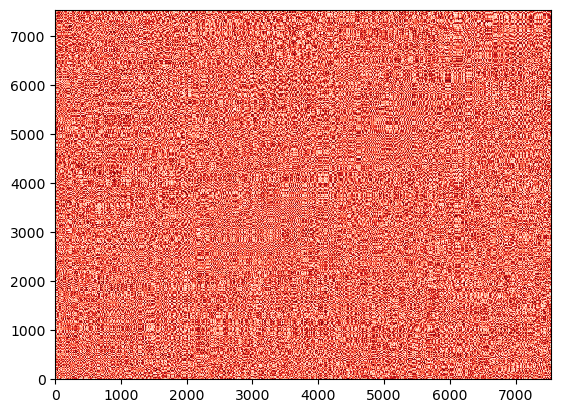

In [36]:
plt.pcolormesh(distance_matrix, cmap='Reds')

####  Combine time and distance

In [102]:
# Normalize distance using mean
distance_matrix_norm = distance_matrix/np.median(distance_matrix)

# Normalize time difference using mean
time_diff_matrix_norm = time_diff_matrix/np.median(time_diff_matrix)

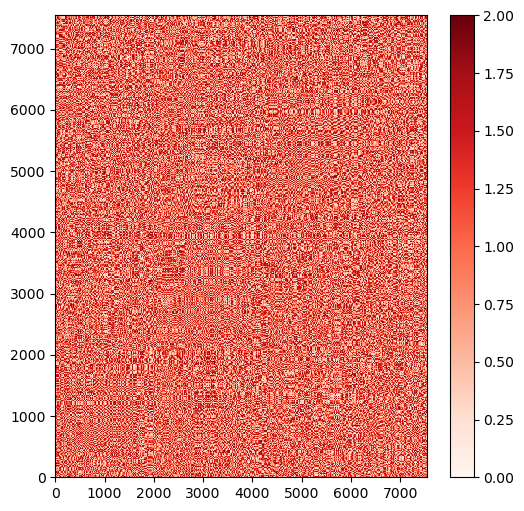

In [103]:
# Establecer el tamaño de la figura
plt.figure(figsize=(6, 6))  

# Crear la visualización de la matriz utilizando pcolormesh
plt.pcolormesh(distance_matrix_norm, cmap='Reds')
plt.colorbar()
plt.show()

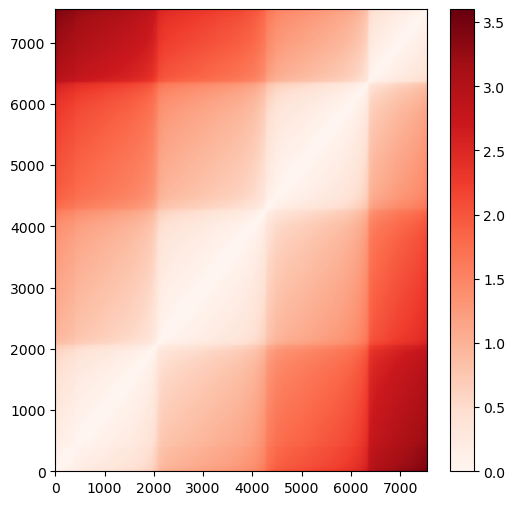

In [104]:
# Establecer el tamaño de la figura
plt.figure(figsize=(6, 6))  

# Crear la visualización de la matriz utilizando pcolormesh
plt.pcolormesh(time_diff_matrix_norm, cmap='Reds')
plt.colorbar()
plt.show()

In [164]:
# Define time factor for exploration
time_factor = 1

# Mix both terms using time factor to weigth them
total_distance_matrix = distance_matrix_norm + time_factor*time_diff_matrix_norm

In [165]:
# plt.figure(figsize=(6, 6))
# plt.pcolormesh(total_distance_matrix, cmap='Reds')
# plt.colorbar()
# plt.show()

In [166]:
clusterer = hdbscan.HDBSCAN(
    min_cluster_size=2,
    gen_min_span_tree=True,
    metric="precomputed",
    min_samples=2,
    cluster_selection_method="leaf",
    cluster_selection_epsilon=0.04
)
clusterer.fit(total_distance_matrix)

HDBSCAN(cluster_selection_epsilon=0.04, cluster_selection_method='leaf',
        gen_min_span_tree=True, metric='precomputed', min_cluster_size=2,
        min_samples=2)

In [167]:
# clusterer.condensed_tree_.plot()
# plt.show()

In [168]:
cmap = cc.cm.glasbey_dark
color_palette = sns.color_palette(cmap.colors, np.max(clusterer.labels_)+1)

cluster_colors = [color_palette[x] if x >= 0
                  else (0, 0, 0)
                  for x in clusterer.labels_]

np.sum(clusterer.labels_ == -1)

3126

In [169]:
clusters_quantity = len(np.unique(clusterer.labels_))

len(allMag) // clusters_quantity

6

In [170]:
clusters_quantity

1164

In [171]:
duration = pd.Timedelta(8*365, "d") # In years
t1 = np.min(allMag['Date'])
t2 = np.max(allMag['Date'])

rotation_rate = 25.38 # in days

allMag['Rot_time'] = np.floor((allMag['Date']-np.min(allMag['Date'])).dt.days//rotation_rate)

# allMag['BMRLongitude'] -= 360*allMag['BMRLongitude']//360

ncycles = np.round((t2-t1)/duration)


# Size definitions
dpi = 400
pxx = 1000  # Horizontal size of each panel
pxy = 10000  # Vertical size of each panel

nph = 5     # Number of horizontal panels
npv = 6     # Number of vertical panels 

# Padding
padv  = 0  #Vertical padding in pixels
padv2 = 0  #Vertical padding in pixels between panels
padh  = 0 #Horizontal padding in pixels at the edge of the figure
padh2 = 0  #Horizontal padding in pixels between panels

# Figure sizes in pixels
fszv = (npv*pxy + 2*padv + (npv-1)*padv2 )      #Vertical size of figure in pixels
fszh = (nph*pxx + 2*padh + (nph-1)*padh2 )      #Horizontal size of figure in pixels

# Conversion to relative units
ppxx   = pxx/fszh      # Horizontal size of each panel in relative units
ppxy   = pxy/fszv      # Vertical size of each panel in relative units
ppadv  = padv/fszv     #Vertical padding in relative units
ppadv2 = padv2/fszv    #Vertical padding in relative units
ppadh  = padh/fszh     #Horizontal padding the edge of the figure in relative units
ppadh2 = padh2/fszh    #Horizontal padding between panels in relative units


# Combine hemispheres 


## Start Figure
fig = plt.figure(figsize=(fszh/dpi,fszv/dpi), dpi = dpi)



size = (np.sqrt(allMag['BMRFlux']/1e21))

for i in np.arange(0,6):

    l1 = -45+i*15
    l2 = -45+(i+1)*15
        
    ax1 = fig.add_axes([ppadh+i*ppxx, ppadv-n*ppxy, ppxx, ppxy])

    # mask = np.logical_and(allMag['Date']>=t1+n*duration, allMag['Date']<t1+(n+1)*duration)
    mask = allMag['BMRLatitude']>=l1
    mask = np.logical_and(mask, allMag['BMRLatitude']<l2)
    
    masknc =  np.logical_and(mask, clusterer.labels_ == -1)
    mask = np.logical_and(mask, clusterer.labels_ > -1)
    mask = np.logical_or(mask, np.in1d(clusterer.labels_, np.unique(clusterer.labels_[mask])))
    
    ax1.scatter(allMag.loc[mask,'BMRLongitude'], allMag.loc[mask,'Date'], s=size[mask], alpha=0.8, ec='None', c=np.array(cluster_colors)[mask])
    ax1.scatter(allMag.loc[masknc,'BMRLongitude'], allMag.loc[masknc,'Date'], s=size[masknc], alpha=0.8, ec='None', c=np.array(cluster_colors)[masknc], marker="D")

    #mask = np.logical_and(mask, allMag['AntiHale'])
    #ax1.scatter(allMag.loc[mask,'Rot_time'], allMag.loc[mask,'BMRLongitude'], s=size[mask], alpha=1,fc='k', ec='None')

    # if n==0:
    ax1.set_title(f'{l1} to {l2}')

    ax1.set_ylim([np.min(allMag['Date']), np.max(allMag['Date'])])

     